
- Auto encoders are a type of Artificial Neural Networks that are used to perform a task of data encoding (representation learning). 
- Auto encoders use the same input data for the input and output, Sounds crazy right!?
- Auto encoders work by adding a bottleneck in the network.
- This bottleneck forces the network to create a compressed (encoded) version of the original input
- Auto encoders work well if correlations exists between input data (performs poorly if the all input data is independent) 






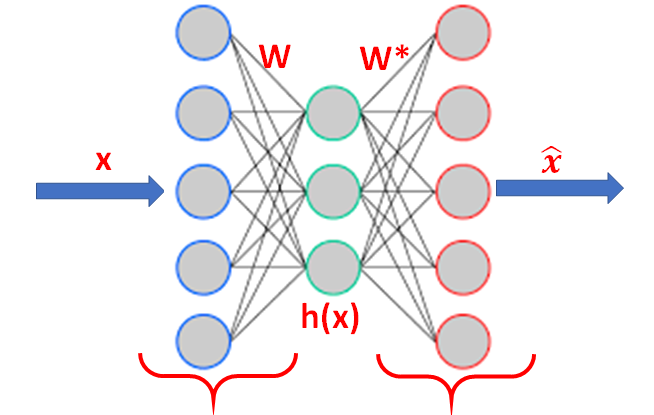

# IMPORT LIBRARIES

In [1]:
import tensorflow as tf

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random 

In [2]:
tf.__version__

'2.7.0'

# LOAD DATASET

In [3]:
from tensorflow.keras.datasets import mnist

(X_train, y_train),(X_test, y_test) = mnist.load_data()

11501568/11490434 [==============================] - 0s 0us/step


# DATA VISUALIZATION

In [4]:
X_train.shape

(60000, 28, 28)

In [5]:
X_test.shape

(10000, 28, 28)

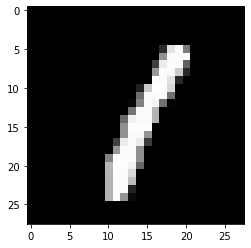

In [6]:
# Let's view some images!
i = random.randint(1,60000) # select any random index from 1 to 60,000

plt.imshow( X_train[i] , cmap = 'gray') # reshape and plot the image



In [7]:
label = y_train[i]
label


1

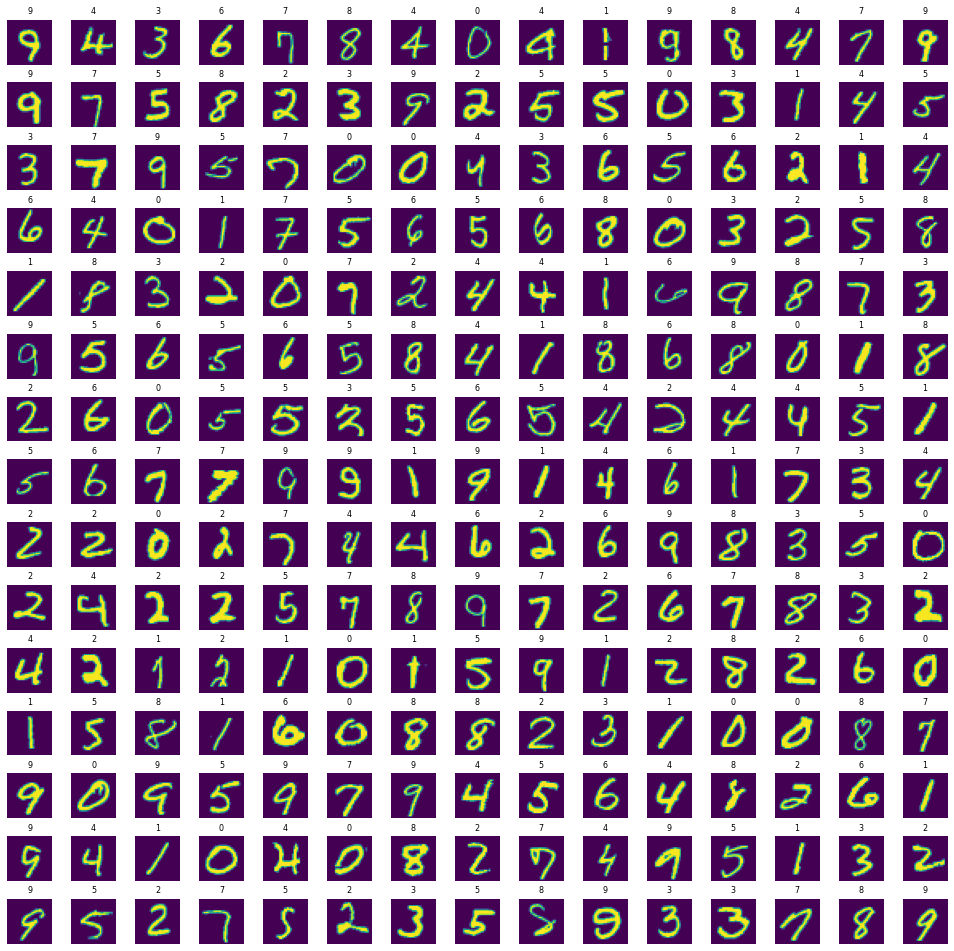

In [8]:
# Let's view more images in a grid format
# Define the dimensions of the plot grid 
W_grid = 15
L_grid = 15

# fig, axes = plt.subplots(L_grid, W_grid)
# subplot return the figure object and axes object
# we can use the axes object to plot specific figures at various locations

fig, axes = plt.subplots(L_grid, W_grid, figsize = (17,17))

axes = axes.ravel() # flaten the 15 x 15 matrix into 225 array

n_training = len(X_train) # get the length of the training dataset

for i in np.arange(0, W_grid * L_grid): # create evenly spaces variables 

    # Select a random number
    index = np.random.randint(0, n_training)
    # read and display an image with the selected index    
    axes[i].imshow( X_train[index] )
    axes[i].set_title(y_train[index], fontsize = 8)
    axes[i].axis('off')

plt.subplots_adjust(hspace=0.4)


# LET'S ADD SOME NOISE TO OUR DATASET!

In [9]:
# Let's normalize the data
X_train = X_train / 255
X_test = X_test / 255

In [10]:
# Let's create some noise with the same dimensions as the original image (28,28)
added_noise = np.random.randn(*(28,28))

In [11]:
added_noise.shape

(28, 28)

In [12]:
noise_factor = 0.3
added_noise = noise_factor * np.random.randn(*(28,28))

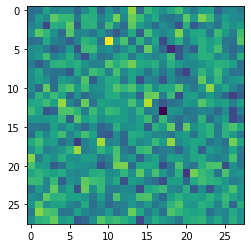

In [13]:
plt.imshow(added_noise)

In [14]:
# Let's take a sample image and add noise to it
noise_factor = 0.2
sample_image = X_train[101]
noisy_sample_image = sample_image + noise_factor * np.random.randn(*(28,28))

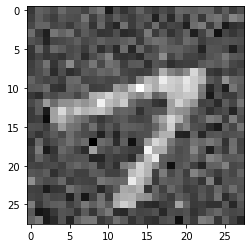

In [15]:
plt.imshow(noisy_sample_image, cmap="gray")

In [16]:
noisy_sample_image.max()

1.511899088201397

In [17]:
noisy_sample_image.min()

-0.6508258155336257

In [18]:
# Let's clip the image to range from 0 to 1
noisy_sample_image = np.clip(noisy_sample_image, 0., 1.)

In [19]:
noisy_sample_image.max()

1.0

In [20]:
noisy_sample_image.min()

0.0

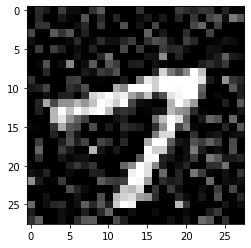

In [21]:
plt.imshow(noisy_sample_image, cmap="gray")

In [22]:
# Let's do the same operation over all the images contained in the training dataset
X_train_noisy = []
noise_factor = 0.2

for sample_image in X_train:
  sample_image_noisy = sample_image + noise_factor * np.random.randn(*(28,28))
  sample_image_noisy = np.clip(sample_image_noisy, 0., 1.)
  X_train_noisy.append(sample_image_noisy)

In [23]:
X_train_noisy # this is a list, let's convert it to array

[array([[2.40365190e-01, 1.34148818e-01, 5.66103346e-02, 2.67311703e-01,
         7.25602856e-02, 0.00000000e+00, 1.88791544e-01, 1.78281648e-01,
         1.58973641e-01, 2.00935598e-01, 3.65302937e-02, 6.65288229e-02,
         0.00000000e+00, 3.18407813e-01, 0.00000000e+00, 3.14422711e-01,
         8.68157115e-04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00, 3.54066406e-01, 1.88066746e-01, 0.00000000e+00,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.09414170e-01],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         2.80596819e-02, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00, 0.00000000e+00, 1.16586170e-01, 5.20325552e-03,
         3.57614143e-01, 2.14731935e-01, 2.35629826e-01, 0.00000000e+00,
         0.00000000e+00, 0.00000000e+00, 1.75062022e-01, 0.00000000e+00,
         1.89207085e-01, 2.20473371e-01, 2.56749303e-01, 0.00000000e+00,
         2.22231870e-01, 4.17613913e-01, 0.0000000

In [24]:
 # Convert from list to array
X_train_noisy = np.array(X_train_noisy)

In [25]:
X_train_noisy.shape

(60000, 28, 28)

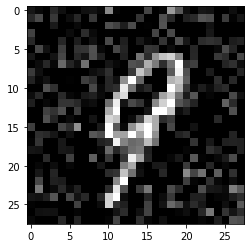

In [26]:
plt.imshow(X_train_noisy[22], cmap="gray")

In [27]:
# Let's do the same operation for the testing dataset as well
X_test_noisy = []
noise_factor = 0.4

for sample_image in X_test:
  sample_image_noisy = sample_image + noise_factor * np.random.randn(*(28,28))
  sample_image_noisy = np.clip(sample_image_noisy, 0., 1.)
  X_test_noisy.append(sample_image_noisy)

# Convert from list to array
X_test_noisy = np.array(X_test_noisy)

In [28]:
X_test_noisy.shape

(10000, 28, 28)

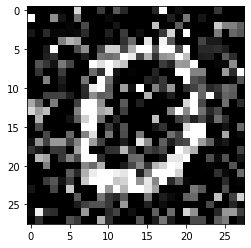

In [29]:
# Let's make sure that the test images are noisy as well!
plt.imshow(X_test_noisy[10], cmap = 'gray')

# BUILD AND TRAIN OUR AUTOENCODER DEEP LEARNING MODEL

In [30]:
autoencoder = tf.keras.models.Sequential()

# Let's build the encoder CNN
autoencoder.add(tf.keras.layers.Conv2D(16, (3,3), strides=1, padding="same", input_shape=(28, 28, 1)))
autoencoder.add(tf.keras.layers.MaxPooling2D((2,2), padding="same"))

autoencoder.add(tf.keras.layers.Conv2D(8, (3,3), strides=1, padding="same"))
autoencoder.add(tf.keras.layers.MaxPooling2D((2,2), padding="same"))

# Encoded image (code layer)
autoencoder.add(tf.keras.layers.Conv2D(8, (3,3), strides=1, padding="same"))

# Let's build the decoder CNN 
autoencoder.add(tf.keras.layers.UpSampling2D((2, 2)))
autoencoder.add(tf.keras.layers.Conv2DTranspose(8,(3,3), strides=1, padding="same"))

autoencoder.add(tf.keras.layers.UpSampling2D((2, 2)))
# autoencoder.add(tf.keras.layers.Conv2DTranspose(1, (3,3), strides=1, padding="same"))
autoencoder.add(tf.keras.layers.Conv2DTranspose(1, (3,3), strides=1, activation='sigmoid', padding="same"))


In [31]:
autoencoder.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(lr=0.001))
autoencoder.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 8)         1160      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 8)          0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 8)           584       
                                                                 
 up_sampling2d (UpSampling2D  (None, 14, 14, 8)        0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [32]:

autoencoder.fit(X_train_noisy.reshape(-1, 28, 28, 1),          
          X_train.reshape(-1, 28, 28, 1), 
          epochs=10, 
          batch_size=200)


Epoch 1/10
300/300 [==============================] - 33s 10ms/step - loss: 0.2107
Epoch 2/10
300/300 [==============================] - 3s 10ms/step - loss: 0.1102
Epoch 3/10
300/300 [==============================] - 3s 10ms/step - loss: 0.1014
Epoch 4/10
300/300 [==============================] - 3s 10ms/step - loss: 0.0968
Epoch 5/10
300/300 [==============================] - 3s 10ms/step - loss: 0.0938
Epoch 6/10
300/300 [==============================] - 3s 10ms/step - loss: 0.0915
Epoch 7/10
300/300 [==============================] - 3s 10ms/step - loss: 0.0899
Epoch 8/10
300/300 [==============================] - 3s 10ms/step - loss: 0.0886
Epoch 9/10
300/300 [==============================] - 3s 10ms/step - loss: 0.0877
Epoch 10/10
300/300 [==============================] - 3s 10ms/step - loss: 0.0870


# EVALUATE THE MODEL

In [40]:
X_test_noisy.shape

(10000, 28, 28)

In [33]:
# Let's pick up 15 images and run them through the trained autoencoder
denoised_images = autoencoder.predict(X_test_noisy[:15].reshape(-1, 28, 28, 1))

In [34]:
denoised_images.shape

(15, 28, 28, 1)

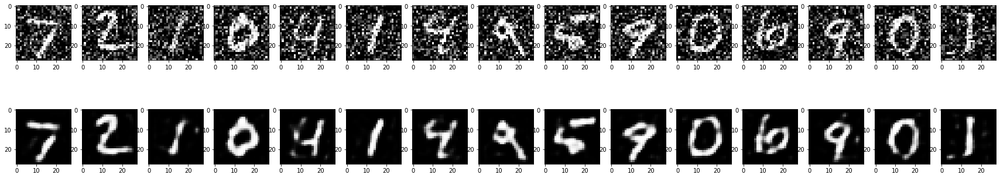

In [35]:
fig, axes = plt.subplots(nrows=2, ncols=15, figsize=(30,6))
for images, row in zip([X_test_noisy[:15], denoised_images], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='gray')
    

# LET'S CONFIRM THE DIMENSIONS

Notes: 


*   If stride = 1 and we use "same" padding, the output feature map dimension will be equal to the output dimensions. Example: 
> autoencoder.add(tf.keras.layers.Conv2D(16, (3,3), strides=1, padding="same", input_shape=(28, 28, 1)))
* If stride = 2 and we use "same" padding, the output feature map dimesions will be smaller (cut in half)
> autoencoder.add(tf.keras.layers.Conv2D(16, (3,3), strides=2, padding="same", input_shape=(28, 28, 1)))

* Padding = 'same' means that we would like to preserve the dimensions of the input so during the convolution process, zero padding will be added around the image
* padding = 'valid' means that we are ready to lose information so the only valid pixels are the ones present at the edges of the input image, ie: do not add any padding around the image

* Maxpooling to Conv2d with padding "same" -> no change in size
* Conv2d to Maxpooling with same padding and stride 1 -> size half

